In [38]:
%matplotlib notebook
from datacube.storage import masking
from datacube import Datacube
from datetime import datetime
from skimage import exposure

In [39]:
dc = Datacube(app = 'ls8')

## Define some plotting functions for later on

In [45]:
def threeBandImage(ds, bands, time = 0, figsize = [10,10], projection = 'projected'):
    '''
    threeBandImage takes three spectral bands and plots them on the RGB bands of an image. 
    
    Inputs: 
    ds -   Dataset containing the bands to be plotted
    bands - list of three bands to be plotted
    
    Optional:
    time - Index value of the time dimension of ds to be plotted
    figsize - dimensions for the output figure
    projection - options are 'projected' or 'geographic'. To determine if the image is in degrees or northings
    '''
    t, y, x = ds[bands[0]].shape
    rawimg = np.zeros((y,x,3), dtype = np.float32)
    for i, colour in enumerate(bands):
        rawimg[:,:,i] = ds[colour][time].values
    rawimg[rawimg == -999] = np.nan
    img_toshow = exposure.equalize_hist(rawimg, mask = np.isfinite(rawimg))
    fig = plt.figure(figsize = figsize)
    imshow(img_toshow)
    ax = plt.gca()
    ax.set_title(str(ds.time[time].values), fontweight = 'bold', fontsize = 16)
    ax.set_xticklabels(ds.x.values)
    ax.set_yticklabels(ds.y.values)
    if projection == 'geographic':
        ax.set_xlabel('Longitude', fontweight = 'bold')
        ax.set_ylabel('Latitude', fontweight = 'bold')
    else:
        ax.set_xlabel('Eastings', fontweight = 'bold')
        ax.set_ylabel('Northings', fontweight = 'bold')

def threeBandImage_subplots(ds, bands, num_cols, figsize = [10,10], projection = 'projected', left  = 0.125, 
                            right = 0.9, bottom = 0.1, top = 0.9, wspace = 0.2, hspace = 0.4):
    '''
    threeBandImage_subplots takes three spectral bands and multiple time steps, and plots them 
    on the RGB bands of an image. 
    
    Inputs: 
    ds -   Dataset containing the bands to be plotted
    bands - list of three bands to be plotted
    num_cols - number of columns for the subplot
    
    Optional:
    figsize - dimensions for the output figure
    projection - options are 'projected' or 'geographic'. To determine if the image is in degrees or northings
    left  = 0.125  # the space on the left side of the subplots of the figure
    right = 0.9    # the space on the right side of the subplots of the figure
    bottom = 0.1   # the space on the bottom of the subplots of the figure
    top = 0.9      # the space on the top of the subplots of the figure
    wspace = 0.2   # the amount of width reserved for blank space between subplots
    hspace = 0.2   # the amount of height reserved for white space between subplots
    '''
    # Find the number of rows/columns we need, based on the number of time steps in ds
    timesteps = ds.time.size
    num_rows = int(ceil(timesteps/num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize = figsize)
    fig.subplots_adjust(left  = left, right = right, bottom = bottom, top = top, wspace = wspace, hspace = hspace)
    numbers = 0
    try:
        for ax in axes.flat:
            t, y, x = ds[bands[0]].shape
            rawimg = np.zeros((y,x,3), dtype = np.float32)
            for i, colour in enumerate(bands):
                rawimg[:,:,i] = ds[colour][numbers].values
            rawimg[rawimg == -999] = np.nan
            img_toshow = exposure.equalize_hist(rawimg, mask = np.isfinite(rawimg))
            ax.imshow(img_toshow)
            ax.set_title(str(ds.time[numbers].values), fontweight = 'bold', fontsize = 12)
            ax.set_xticklabels(ds.x.values, fontsize = 8, rotation = 20)
            ax.set_yticklabels(ds.y.values, fontsize = 8)
            if projection == 'geographic':
                ax.set_xlabel('Longitude', fontweight = 'bold', fontsize = 10)
                ax.set_ylabel('Latitude', fontweight = 'bold', fontsize = 10)
            else:
                ax.set_xlabel('Eastings', fontweight = 'bold', fontsize = 10)
                ax.set_ylabel('Northings', fontweight = 'bold', fontsize = 10)
            numbers = numbers + 1
    except IndexError:
        # This error will pop up if there are not enough scenes to fill the number of rows x columns, so we can 
        # safely ignore it
        pass  
    
def write_your_netcdf(data, dataset_name, filename, crs):
    '''this function turns an xarray dataarray into a dataset so we can write it to netcdf. It adds on a crs definition
    from the original array. data = your xarray dataset, dataset_name is a string describing your variable. Bex March 2018'''    
    #turn array into dataset so we can write the netcdf
    if isinstance(data,xr.DataArray):
        dataset= data.to_dataset(name=dataset_name)
    elif isinstance(data,xr.Dataset):
        dataset = data
    else:
        print('your data might be the wrong type, it is: '+type(data))
    #grab our crs attributes to write a spatially-referenced netcdf
    dataset.attrs['crs'] = crs
    dataset.attrs['affine'] =affine
    #dataset.dataset_name.attrs['crs'] = crs
    try:
        write_dataset_to_netcdf(dataset, filename)
    except RuntimeError as err:
        print("RuntimeError: {0}".format(err))   
        
def new_dataset_to_geotiff(filename, data):
    '''
    this function uses rasterio and numpy to write a multi-band geotiff for one
    timeslice, or for a single composite image. It assumes the input data is an
    xarray dataset (note, dataset not dataarray) and that you have crs and affine
    objects attached.It will use the correct predictor for either int or float dtypes.
    future users may wish to assert that these assumptions are correct.
    Last modified: April 2018
    Authors: Bex Dunn and Josh Sixsmith
    Modified by: Claire Krause, Robbi Bishop-Taylor, Bex Dunn
    inputs
    filename - string containing filename to write out to
    data - dataset to write out
    Note: this function cuurrently requires the data have lat/lon only, i.e. no
    time dimension
    '''

    kwargs = {'driver': 'GTiff',
              'count': len(data.data_vars),  # geomedian no time dim
              'width': data.sizes['x'], 'height': data.sizes['y'],
              'crs': data.crs.crs_str,
              'transform': data.affine,
              'dtype': list(data.data_vars.values())[0].values.dtype,
              'nodata': 0,
              'compress': 'deflate', 'zlevel': 4, 'predictor': 2}
    # for ints use 2 for floats use 3} ### FIXME how to set the predictor conditionally?

    with rasterio.open(filename, 'w', **kwargs) as src:
        for i, band in enumerate(data.data_vars):
            src.write(data[band].data, i + 1)        
        

In [41]:
query = {
        'lat': (-19.50, -20.00),
        'lon': (145.05, 145.20),
        'output_crs': 'EPSG:3577',
        'resolution': (-10, 10),
        'time':('2017-08-01', '2017-10-01')
}

In [42]:
TheBrook = dc.load(product='ls8_nbar_albers', group_by='solar_day', **query)

## See what came back from the extraction

In [59]:
TheBrook[['red','green','blue']]

<xarray.Dataset>
Dimensions:  (time: 7, x: 2129, y: 5689)
Coordinates:
  * time     (time) datetime64[ns] 2017-08-07T00:16:48 ...
  * y        (y) float64 -2.158e+06 -2.158e+06 -2.158e+06 -2.158e+06 ...
  * x        (x) float64 1.357e+06 1.357e+06 1.357e+06 1.357e+06 1.357e+06 ...
Data variables:
    red      (time, y, x) int16 881 881 881 871 871 810 810 810 792 792 863 ...
    green    (time, y, x) int16 675 675 675 666 666 642 642 642 630 630 662 ...
    blue     (time, y, x) int16 489 489 489 496 496 458 458 458 468 468 476 ...
Attributes:
    crs:      EPSG:3577

# Plot this scene up as true colour image

True colour images approximate what the human eye sees when looking at a landscape. Note that the function used for this true colour plot enhances the contrast between the bands, resulting in a colour-enhanced image.

<IPython.core.display.Javascript object>


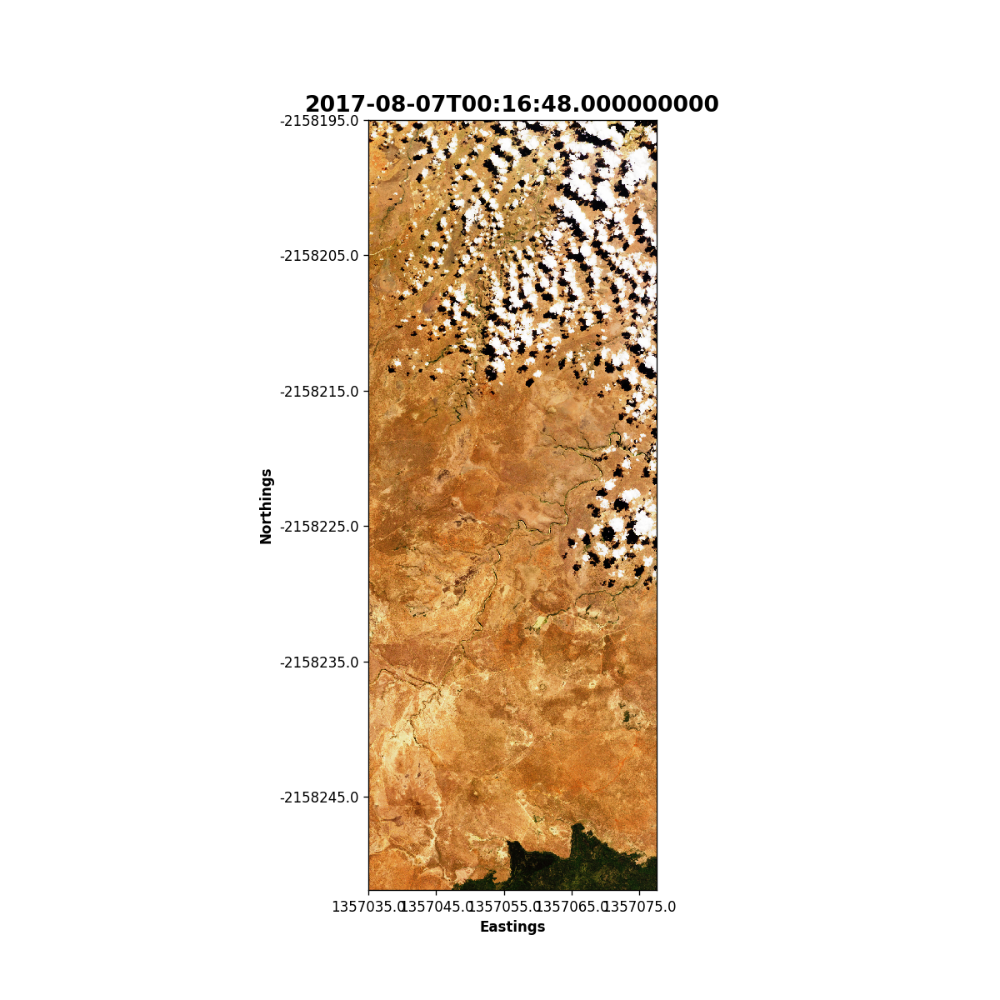

<IPython.core.display.Javascript object>


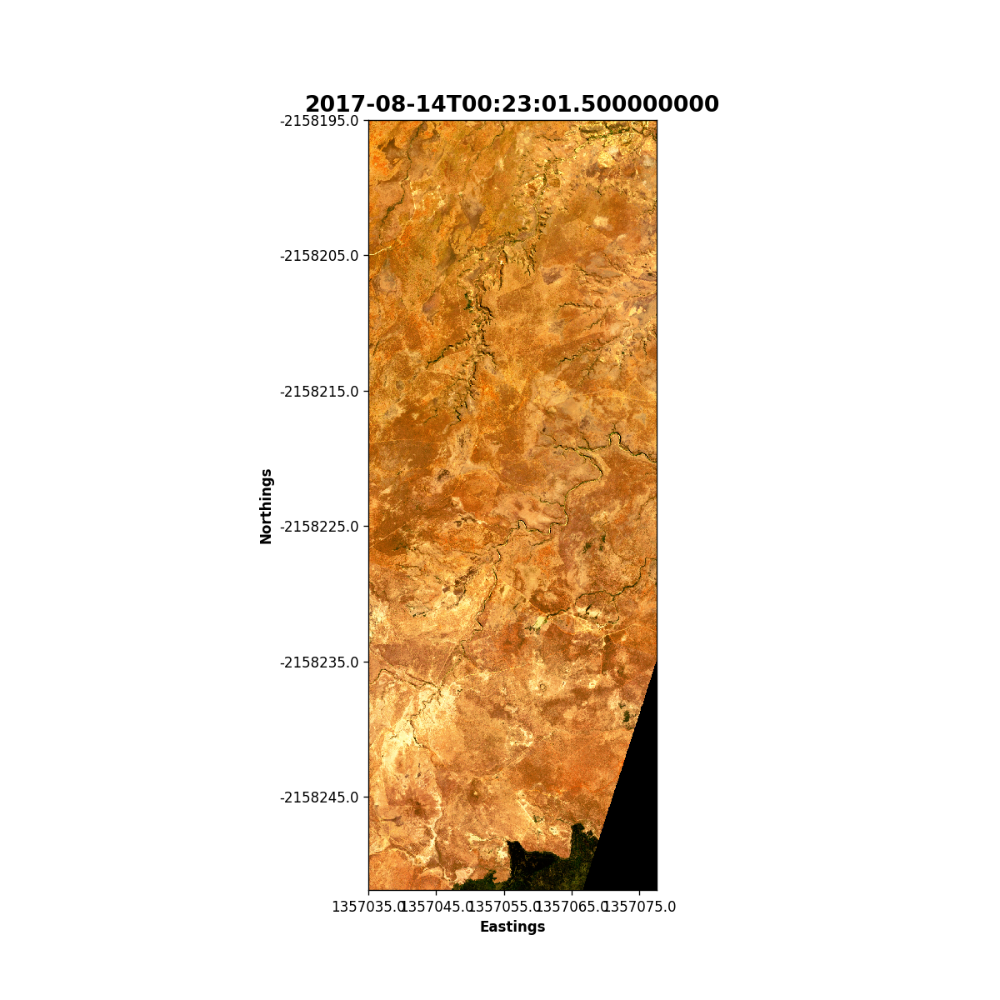

<IPython.core.display.Javascript object>


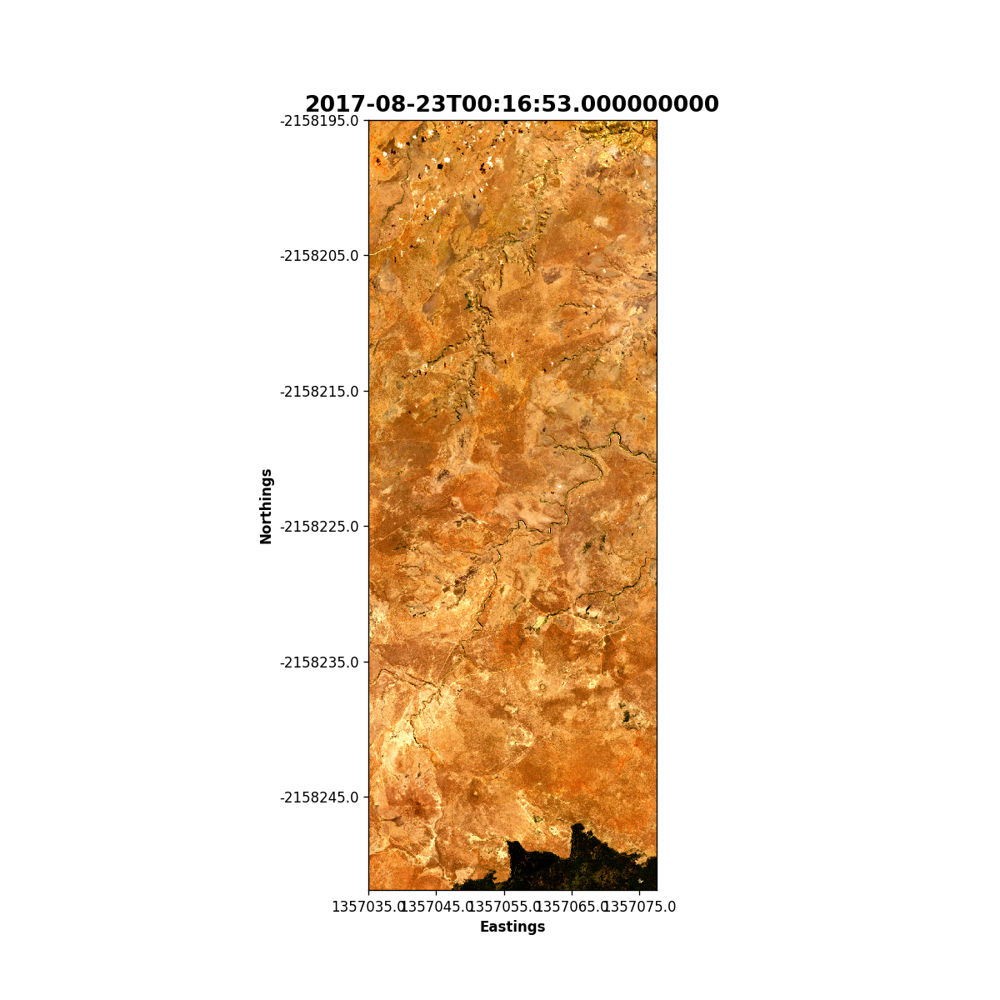

<IPython.core.display.Javascript object>


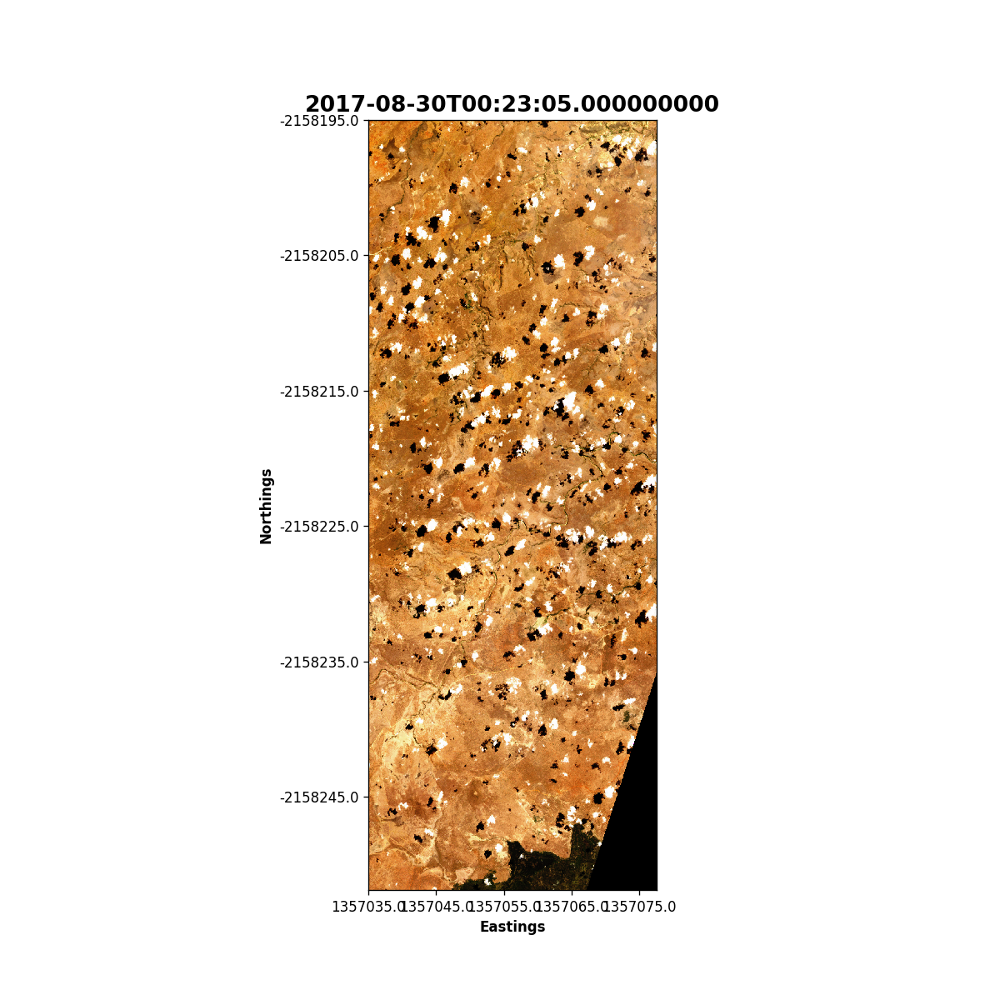

<IPython.core.display.Javascript object>


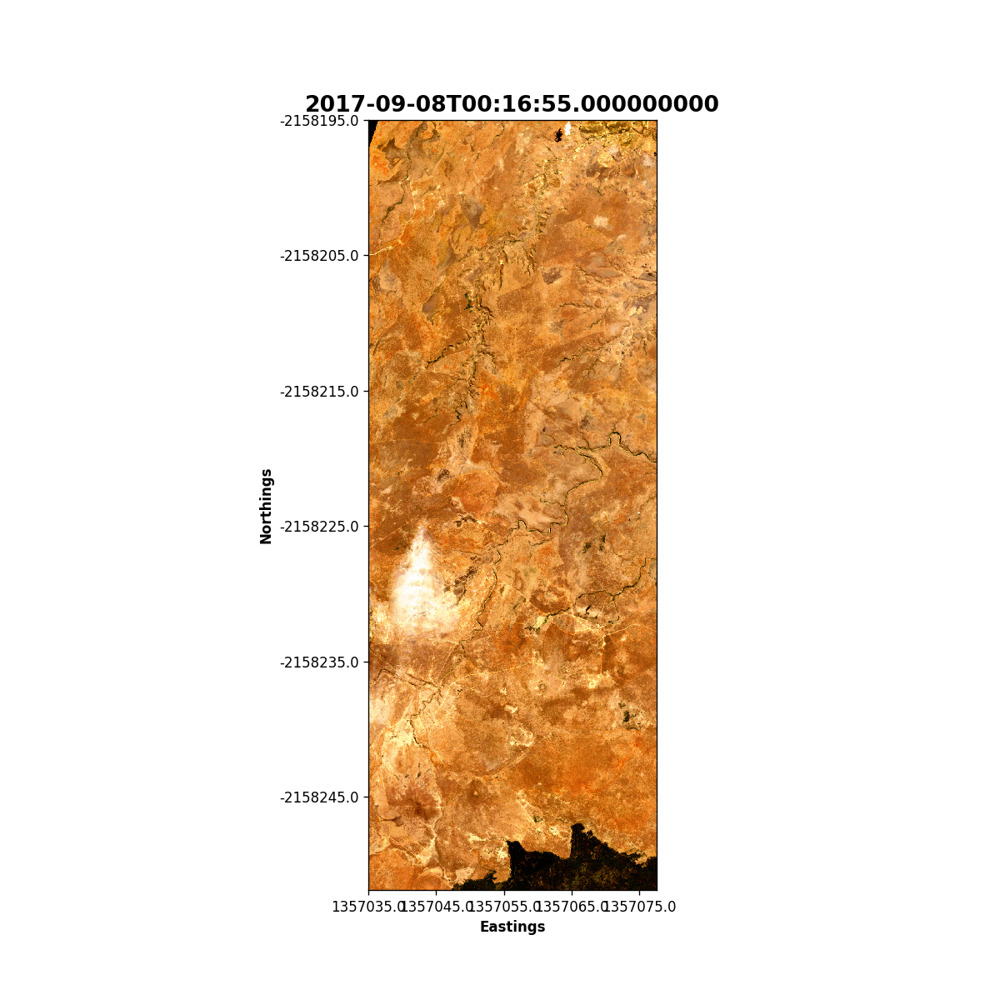

<IPython.core.display.Javascript object>


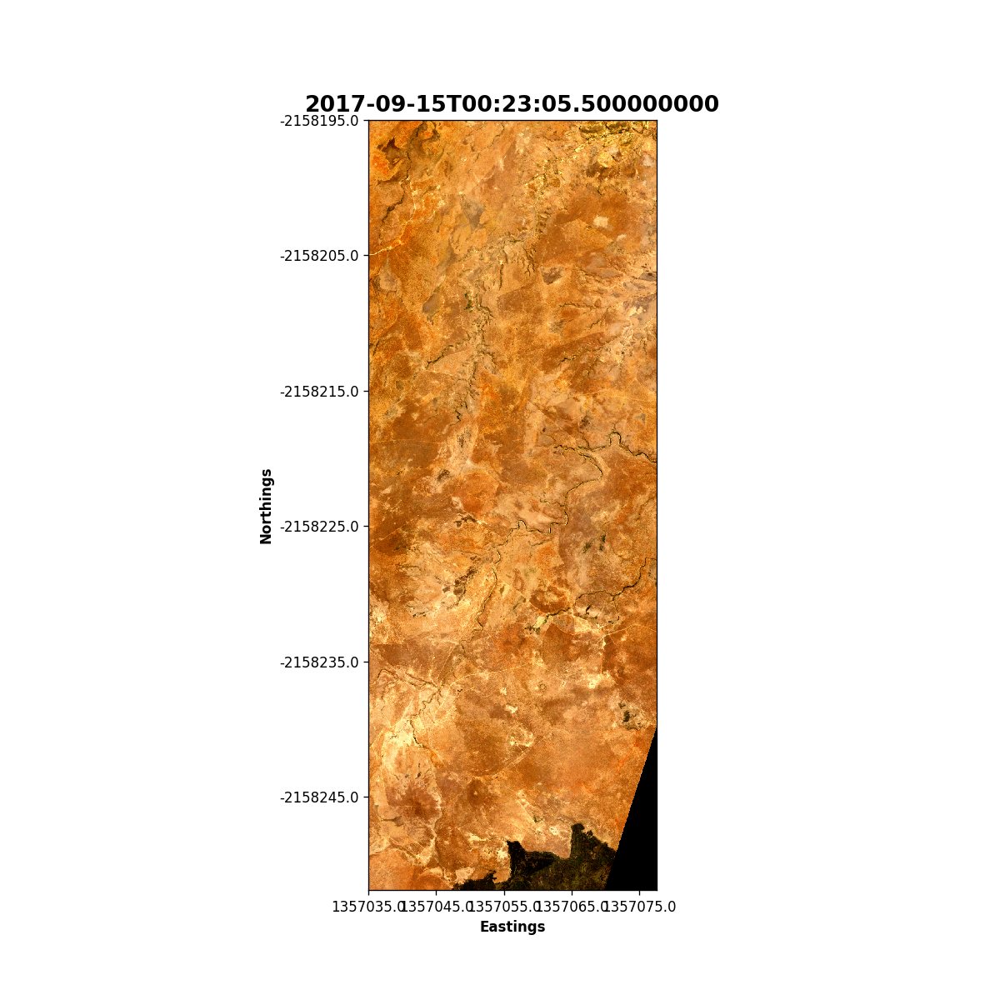

In [44]:
plt.clf()
#loops through the data, plots false color images and saves them as individual PNG images
for i in range(0,6):
    threeBandImage(TheBrook, bands=['red', 'green', 'blue'],time =i)
    #plt.savefig('./test_image_{}.png'.format(product_time.index[i]))
    plt.show()

Populating the interactive namespace from numpy and matplotlib


/g/data/v10/public/modules/agdc-py3-env/20171214/envs/agdc/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['datetime']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


<IPython.core.display.Javascript object>


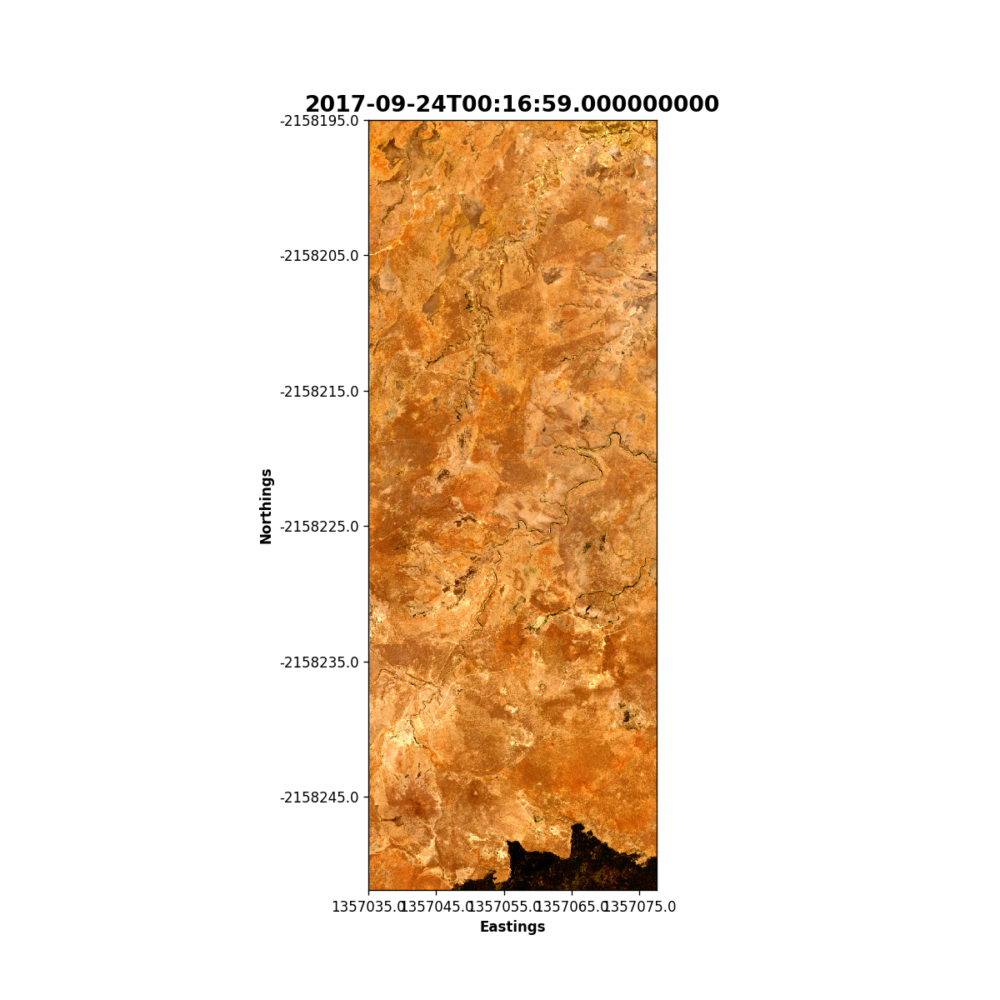

In [46]:
%pylab notebook
threeBandImage(TheBrook, bands = ['red', 'green', 'blue'], time = 6)

In [49]:
save_to = '/g/data/r78/rjd547/groundwater_activities/Images/UpperBurdekin18/S2_fieldwork/'

In [53]:
import rasterio
new_dataset_to_geotiff(save_to+'TheBrook_ls8_6.tif', TheBrook.isel(time=6))

In [57]:
TheBrook=TheBrook.where()

<xarray.DataArray 'red' (time: 7, y: 5689, x: 2129)>
array([[[ 881,  881, ...,  850,  815],
        [ 881,  881, ...,  850,  815],
        ..., 
        [ 696,  696, ...,  365,  344],
        [ 696,  696, ...,  365,  344]],

       [[ 806,  806, ...,  987,  977],
        [ 806,  806, ...,  987,  977],
        ..., 
        [ 729,  729, ..., -999, -999],
        [ 729,  729, ..., -999, -999]],

       ..., 
       [[1004, 1004, ..., 1137, 1173],
        [1004, 1004, ..., 1137, 1173],
        ..., 
        [ 875,  875, ..., -999, -999],
        [ 875,  875, ..., -999, -999]],

       [[-999, -999, ..., 1164, 1176],
        [-999, -999, ..., 1164, 1176],
        ..., 
        [ 852,  852, ...,  448,  432],
        [ 852,  852, ...,  448,  432]]], dtype=int16)
Coordinates:
  * time     (time) datetime64[ns] 2017-08-07T00:16:48 ...
  * y        (y) float64 -2.158e+06 -2.158e+06 -2.158e+06 -2.158e+06 ...
  * x        (x) float64 1.357e+06 1.357e+06 1.357e+06 1.357e+06 1.357e+06 ...
Attribute